# Detectron2 Beginner's Tutorial

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

Welcome to detectron2! This is the official colab tutorial of detectron2. Here, we will go through some basics usage of detectron2, including the following:
* Run inference on images or videos, with an existing detectron2 model
* Train a detectron2 model on a new dataset

You can make a copy of this tutorial by "File -> Open in playground mode" and play with it yourself. __DO NOT__ request access to this tutorial.


# Install detectron2

In [5]:
# install dependencies: 
!pip install pyyaml==5.1 'pycocotools>=2.0.1'
#!pip install torch==1.6.0+cu101 torchvision==0.7.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html

import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
#!gcc --version
# opencv is pre-installed on colab

1.7.0+cu101 True


In [7]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.6)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#assert torch.__version__.startswith("1.6")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
     |████████████████████████████████| 6.6MB 605kB/s 
     |████████████████████████████████| 2.2MB 11.4MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.2.post20201104-cp36-none-any.whl size=44419 sha256=54b20c7129db57044d639729bb2a39d8270f736f4c97a426cc790af727e8c1e8
  Stored in directory: /root/.cache/pip/wheels/ec/4d/40/4077356fe02ef345791713eabede5ed63afe7d613b016694d1
Successfully built fvcore
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0


In [1]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [2]:

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
def load_sem_seg(gt_root, image_root, gt_ext="png", image_ext="jpg"):
    """
    Load semantic segmentation datasets. All files under "gt_root" with "gt_ext" extension are
    treated as ground truth annotations and all files under "image_root" with "image_ext" extension
    as input images. Ground truth and input images are matched using file paths relative to
    "gt_root" and "image_root" respectively without taking into account file extensions.
    This works for COCO as well as some other datasets.

    Args:
        gt_root (str): full path to ground truth semantic segmentation files. Semantic segmentation
            annotations are stored as images with integer values in pixels that represent
            corresponding semantic labels.
        image_root (str): the directory where the input images are.
        gt_ext (str): file extension for ground truth annotations.
        image_ext (str): file extension for input images.

    Returns:
        list[dict]:
            a list of dicts in detectron2 standard format without instance-level
            annotation.

    Notes:
        1. This function does not read the image and ground truth files.
           The results do not have the "image" and "sem_seg" fields.
    """

    # We match input images with ground truth based on their relative filepaths (without file
    # extensions) starting from 'image_root' and 'gt_root' respectively.
    def file2id(folder_path, file_path):
        # extract relative path starting from `folder_path`
        image_id = os.path.normpath(os.path.relpath(file_path, start=folder_path))
        # remove file extension
        image_id = os.path.splitext(image_id)[0]
        return image_id

    input_files = sorted(
        (os.path.join(image_root, f) for f in PathManager.ls(image_root) if f.endswith(image_ext)),
        key=lambda file_path: file2id(image_root, file_path),
    )
    gt_files = sorted(
        (os.path.join(gt_root, f) for f in PathManager.ls(gt_root) if f.endswith(gt_ext)),
        key=lambda file_path: file2id(gt_root, file_path),
    )

    assert len(gt_files) > 0, "No annotations found in {}.".format(gt_root)

    # Use the intersection, so that val2017_100 annotations can run smoothly with val2017 images
    if len(input_files) != len(gt_files):
        logger.warn(
            "Directory {} and {} has {} and {} files, respectively.".format(
                image_root, gt_root, len(input_files), len(gt_files)
            )
        )
        input_basenames = [os.path.basename(f)[: -len(image_ext)] for f in input_files]
        gt_basenames = [os.path.basename(f)[: -len(gt_ext)] for f in gt_files]
        intersect = list(set(input_basenames) & set(gt_basenames))
        # sort, otherwise each worker may obtain a list[dict] in different order
        intersect = sorted(intersect)
        logger.warn("Will use their intersection of {} files.".format(len(intersect)))
        input_files = [os.path.join(image_root, f + image_ext) for f in intersect]
        gt_files = [os.path.join(gt_root, f + gt_ext) for f in intersect]

    logger.info(
        "Loaded {} images with semantic segmentation from {}".format(len(input_files), image_root)
    )

    dataset_dicts = []
    for (img_path, gt_path) in zip(input_files, gt_files):
        record = {}
        record["file_name"] = img_path
        record["sem_seg_file_name"] = gt_path
        dataset_dicts.append(record)

    return dataset_dicts


In [3]:
from fvcore.common.file_io import PathManager
import logging
logger = logging.getLogger(__name__)

#datalabels=load_sem_seg(annotations, images_dir, gt_ext="png", image_ext="png")


##images_dir = "/content/drive/My Drive/CIS581/FinalProject/Kitti/train_images/image_2"
#annotations="/content/drive/My Drive/CIS581/FinalProject/Kitti/trainingmask/"

images_dir = "/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/train/"
annotations="/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/labels/train/"
json_fileloc="/content/drive/My Drive/CIS581/FinalProject/bdd/training_corrected_1000v2.json"

In [4]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train5", {}, "/content/drive/My Drive/CIS581/FinalProject/bdd/training_corrected_1000v2.json",images_dir)



In [5]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

from detectron2.structures import BoxMode

def get_balloon_dicts(img_dir):
    json_file = os.path.join(img_dir, "/content/drive/My Drive/CIS581/FinalProject/bdd/training_corrected_1000v2.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(imgs_anns.values()):
        record = {}
        
        filename = os.path.join(img_dir, v["filename"])
        height, width = cv2.imread(filename).shape[:2]
        
        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width
      
        annos = v["regions"]
        objs = []
        for _, anno in annos.items():
            assert not anno["region_attributes"]
            anno = anno["shape_attributes"]
            px = anno["all_points_x"]
            py = anno["all_points_y"]
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": 0,
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

for d in ["train", "val"]:
    DatasetCatalog.register("balloon" + d, lambda d=d: get_balloon_dicts("balloon/" + d))
    MetadataCatalog.get("balloon" + d).set(thing_classes=["balloon"])
balloon_metadata = MetadataCatalog.get("balloon_train")

[11/08 22:04:12 d2.data.datasets.coco]: Loading /content/drive/My Drive/CIS581/FinalProject/bdd/training_corrected_1000v2.json takes 2.15 seconds.
WARNING [11/08 22:04:12 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/08 22:04:12 d2.data.datasets.coco]: Loaded 999 images in COCO format from /content/drive/My Drive/CIS581/FinalProject/bdd/training_corrected_1000v2.json
filename= /content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/train/08c7c58f-e0b73118.jpg


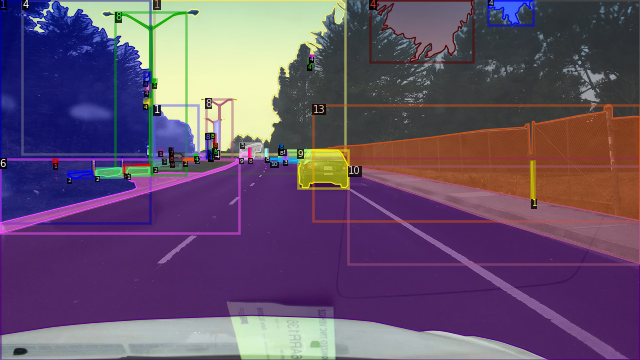

filename= /content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/train/0aa9197a-48cbd686.jpg


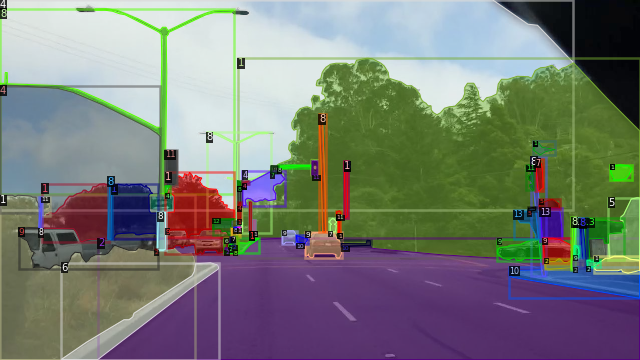

filename= /content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/train/0391de8e-00000000.jpg


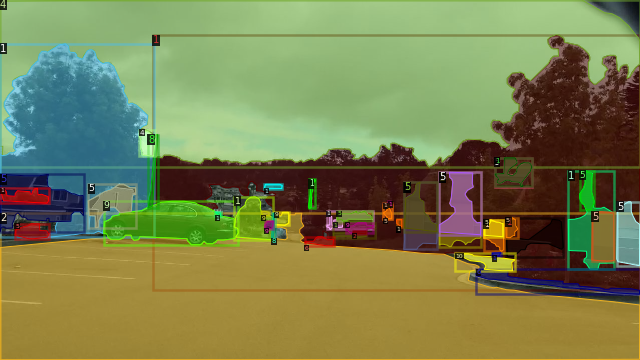

In [6]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train5")
dataset_dicts = DatasetCatalog.get("my_dataset_train5")
import random
from detectron2.utils.visualizer import Visualizer
for d in random.sample(dataset_dicts, 3):
    print("filename=",d["file_name"])
    img = cv2.imread(d["file_name"])

    #print("filename=","/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/train/5421185a-fbbb8f7f.jpg")
    #img = cv2.imread("/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/train/5421185a-fbbb8f7f.jpg")
    visualizer = Visualizer(img[:, :, ::-1], scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])
    #cv2_imshow(img)

In [7]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train5",)
cfg.DATASETS.TEST = ()#"my_dataset_val3",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")#"COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")   #"COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001  #0.00025  # pick a good LR

cfg.SOLVER.WARMUP_ITERS=500
cfg.SOLVER.MAX_ITER = 1000   # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset

#cfg.SOLVER.STEPS=(10,15)
#cfg.SOLVER.GAMMA=0.05

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64 #128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 14  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)

#cfg.TEST.EVAL_PERIOD=500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[11/08 22:05:11 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:08, 21.1MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (15, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (15,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (56, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (56,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due 

[11/08 22:05:26 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:345: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:345: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:345: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python

[11/08 22:05:48 d2.utils.events]:  eta: 0:17:05  iter: 19  total_loss: 6.53  loss_cls: 2.648  loss_box_reg: 0.6475  loss_mask: 0.6916  loss_rpn_cls: 1.721  loss_rpn_loc: 0.8417  time: 1.0408  data_time: 0.0501  lr: 3.8962e-05  max_mem: 4815M
[11/08 22:06:10 d2.utils.events]:  eta: 0:17:07  iter: 39  total_loss: 4.946  loss_cls: 1.998  loss_box_reg: 0.5304  loss_mask: 0.685  loss_rpn_cls: 0.8685  loss_rpn_loc: 0.93  time: 1.0711  data_time: 0.0154  lr: 7.8922e-05  max_mem: 4815M
[11/08 22:06:32 d2.utils.events]:  eta: 0:17:05  iter: 59  total_loss: 3.599  loss_cls: 1.15  loss_box_reg: 0.5952  loss_mask: 0.6732  loss_rpn_cls: 0.3722  loss_rpn_loc: 0.7734  time: 1.0836  data_time: 0.0125  lr: 0.00011888  max_mem: 4815M
[11/08 22:06:55 d2.utils.events]:  eta: 0:16:53  iter: 79  total_loss: 3.393  loss_cls: 1.099  loss_box_reg: 0.6313  loss_mask: 0.6548  loss_rpn_cls: 0.2772  loss_rpn_loc: 0.7076  time: 1.1057  data_time: 0.0152  lr: 0.00015884  max_mem: 4815M
[11/08 22:07:18 d2.utils.event

In [8]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

WARNING [11/08 22:24:37 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/08 22:24:37 d2.data.datasets.coco]: Loaded 999 images in COCO format from /content/drive/My Drive/CIS581/FinalProject/bdd/training_corrected_1000v2.json


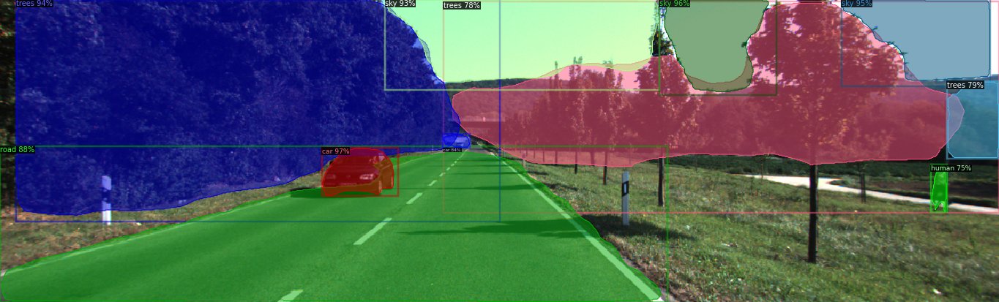

tensor([9, 4, 4, 1, 4, 2, 9, 1, 1, 3], device='cuda:0')
Boxes(tensor([[ 399.7455,  184.2625,  494.8022,  244.5876],
        [ 819.2412,    0.0000,  964.2900,  119.1413],
        [1045.1006,    0.0000, 1229.7190,  107.7688],
        [  20.4489,    0.0000,  620.4863,  276.2794],
        [ 478.3733,    0.0000,  819.3148,  112.1383],
        [   0.0000,  182.0962,  828.9777,  376.0000],
        [ 550.4427,  167.1785,  583.8958,  184.4641],
        [1176.5005,  101.6064, 1241.0000,  197.9809],
        [ 550.9945,    2.5961, 1241.0000,  265.4128],
        [1156.4011,  205.3093, 1176.0417,  264.3813]], device='cuda:0'))
tensor([0.9704, 0.9568, 0.9532, 0.9379, 0.9322, 0.8842, 0.8376, 0.7899, 0.7798,
        0.7498], device='cuda:0')
count= [9 4 4 1 4 2 9 1 1 3]


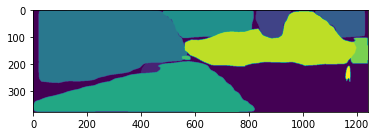

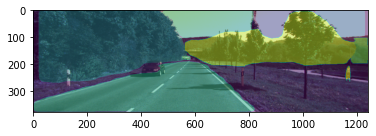

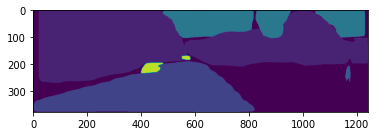

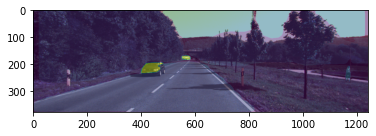

In [9]:
from detectron2.utils.visualizer import ColorMode


#my_dataset_train_metadata = MetadataCatalog.get("my_dataset_val3")
#dataset_dicts = DatasetCatalog.get("my_dataset_train3")
#dataset_dicts = get_balloon_dicts("my_dataset_val3")

#my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train3")
dataset_dicts = DatasetCatalog.get("my_dataset_train5")

#for d in random.sample(dataset_dicts, 3):    
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/Kitti/train_images/image_2/000183_10.png")
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.1)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])





#Get bounding boxes for objects and show complete semantic segmentation image
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)
print(outputs["instances"].scores)
#print(outputs["instances"].pred_masks)



import matplotlib.pyplot as plt
import matplotlib as mpl
newimage=np.zeros((im.shape[0],im.shape[1]))
#print("shape=",im.shape)
count=outputs["instances"].to("cpu").pred_classes.numpy().shape
print("count=",outputs["instances"].to("cpu").pred_classes.numpy())

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(i+1)
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.5)
plt.show()

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(outputs["instances"].to("cpu").pred_classes.numpy()[i])
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()



norm = mpl.colors.Normalize(vmin=0,vmax=count[0])


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.5)
plt.show()

WARNING [11/08 22:24:52 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/08 22:24:52 d2.data.datasets.coco]: Loaded 999 images in COCO format from /content/drive/My Drive/CIS581/FinalProject/bdd/training_corrected_1000v2.json


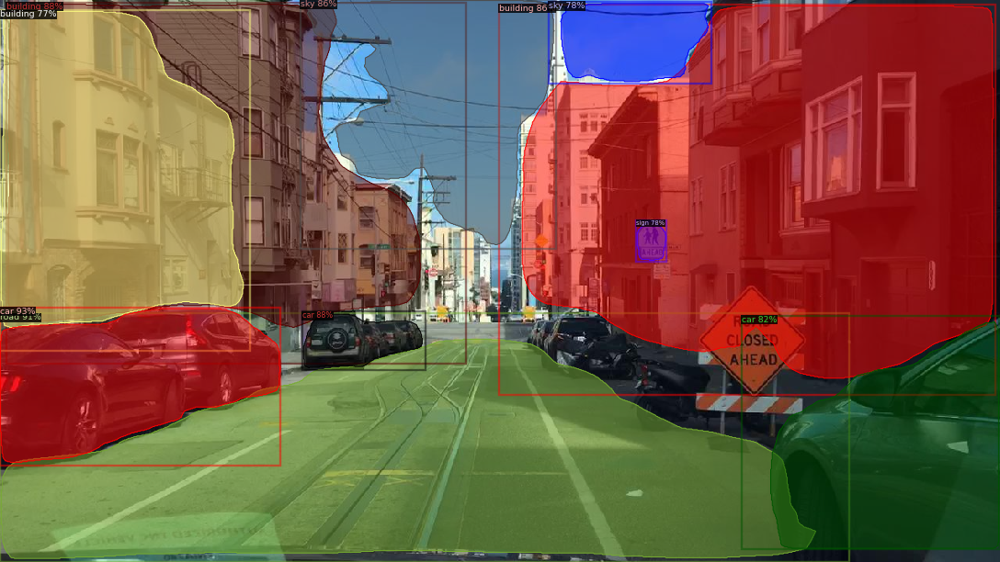

tensor([9, 2, 5, 9, 4, 5, 9, 4, 7, 5], device='cuda:0')
Boxes(tensor([[   0.0000,  393.6043,  358.7615,  596.1114],
        [   0.0000,  401.5872, 1087.2850,  720.0000],
        [   8.1046,    3.3050,  596.2464,  465.5995],
        [ 386.8044,  399.2277,  545.2061,  473.6843],
        [ 384.4869,    0.0000,  711.2231,  318.9287],
        [ 638.7225,    5.4144, 1273.8090,  505.7355],
        [ 949.3798,  404.5138, 1279.3469,  703.3303],
        [ 702.4926,    2.4699,  910.9252,  107.6146],
        [ 814.5269,  282.5222,  852.9563,  334.9373],
        [   0.0000,   13.5064,  319.6530,  448.9094]], device='cuda:0'))
tensor([0.9313, 0.9060, 0.8839, 0.8814, 0.8634, 0.8592, 0.8155, 0.7771, 0.7761,
        0.7749], device='cuda:0')
count= [9 2 5 9 4 5 9 4 7 5]


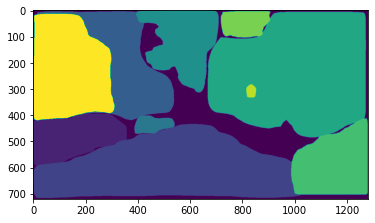

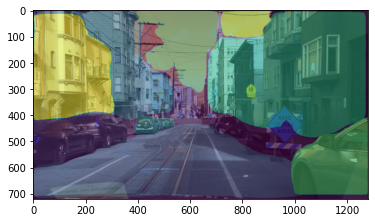

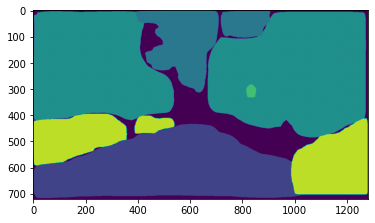

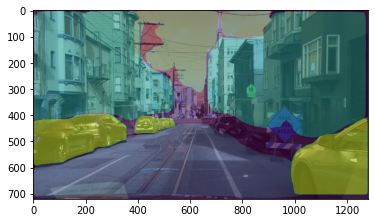

In [10]:
from detectron2.utils.visualizer import ColorMode


#my_dataset_train_metadata = MetadataCatalog.get("my_dataset_val3")
#dataset_dicts = DatasetCatalog.get("my_dataset_train3")
#dataset_dicts = get_balloon_dicts("my_dataset_val3")

#my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train3")
dataset_dicts = DatasetCatalog.get("my_dataset_train5")

#for d in random.sample(dataset_dicts, 3):    
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/f482559d-d3d798d3.jpg")
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=.85)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])




#Get bounding boxes for objects and show complete semantic segmentation image
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)
print(outputs["instances"].scores)
#print(outputs["instances"].pred_masks)



import matplotlib.pyplot as plt
import matplotlib as mpl
newimage=np.zeros((im.shape[0],im.shape[1]))
#print("shape=",im.shape)
count=outputs["instances"].to("cpu").pred_classes.numpy().shape
print("count=",outputs["instances"].to("cpu").pred_classes.numpy())

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(i+1)
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.5)
plt.show()

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(outputs["instances"].to("cpu").pred_classes.numpy()[i])
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()



norm = mpl.colors.Normalize(vmin=0,vmax=count[0])


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.5)
plt.show()

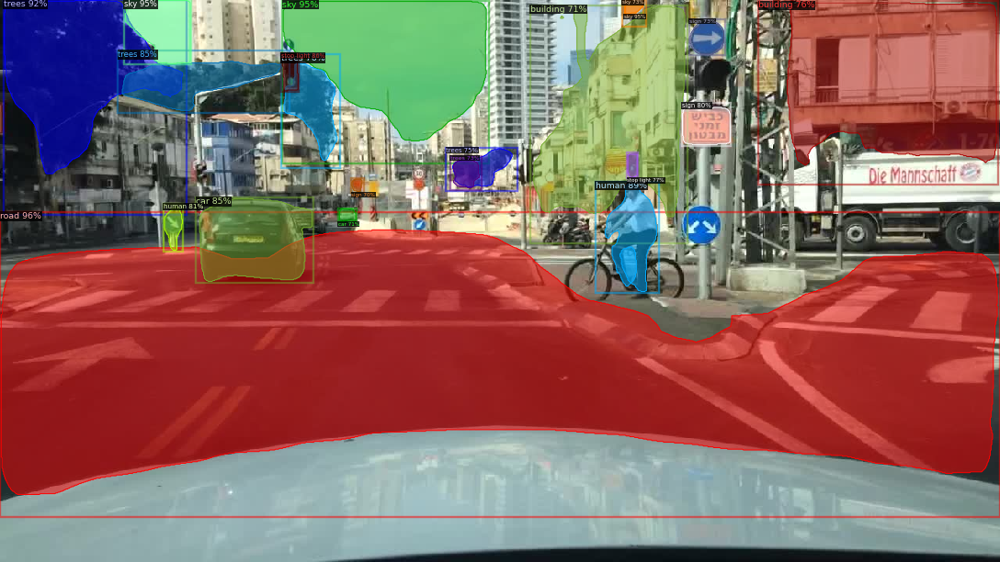

tensor([ 2,  4,  4,  4,  1,  3, 11,  1,  9,  3,  7, 11,  5,  1,  1,  4,  1,  7,
         9,  5,  7], device='cuda:0')
Boxes(tensor([[0.0000e+00, 2.7192e+02, 1.2800e+03, 6.6233e+02],
        [7.9894e+02, 0.0000e+00, 8.2399e+02, 1.8300e+01],
        [3.6156e+02, 7.8300e-01, 6.2595e+02, 2.0911e+02],
        [1.5878e+02, 0.0000e+00, 2.4443e+02, 8.2468e+01],
        [4.6531e+00, 0.0000e+00, 2.3925e+02, 2.7492e+02],
        [7.6242e+02, 2.3251e+02, 8.4337e+02, 3.7513e+02],
        [3.5975e+02, 6.7961e+01, 3.8225e+02, 1.1729e+02],
        [1.5111e+02, 6.4536e+01, 3.7016e+02, 1.4503e+02],
        [2.5085e+02, 2.5308e+02, 4.0152e+02, 3.6244e+02],
        [2.0963e+02, 2.6140e+02, 2.3379e+02, 3.2213e+02],
        [8.7303e+02, 1.3191e+02, 9.3577e+02, 1.8669e+02],
        [8.0278e+02, 1.9500e+02, 8.1688e+02, 2.2840e+02],
        [9.7089e+02, 1.3795e+00, 1.2777e+03, 2.3599e+02],
        [3.5962e+02, 6.9894e+01, 4.3531e+02, 2.1586e+02],
        [5.7113e+02, 1.8888e+02, 6.6186e+02, 2.4457e+02],
      

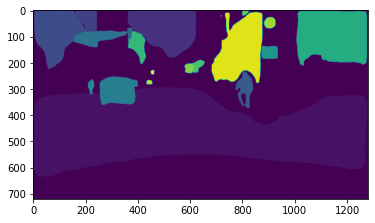

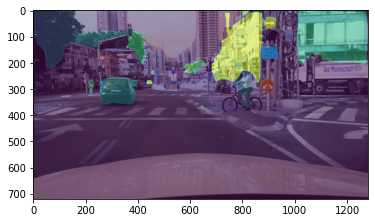

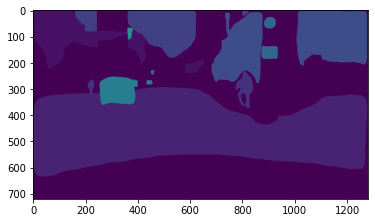

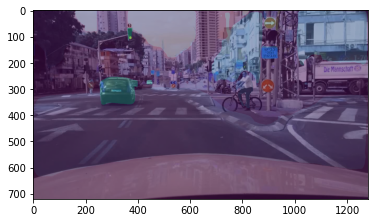

In [11]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/f00e798d-847367b0.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])




#Get bounding boxes for objects and show complete semantic segmentation image
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)
print(outputs["instances"].scores)
#print(outputs["instances"].pred_masks)



import matplotlib.pyplot as plt
import matplotlib as mpl
newimage=np.zeros((im.shape[0],im.shape[1]))
#print("shape=",im.shape)
count=outputs["instances"].to("cpu").pred_classes.numpy().shape
print("count=",outputs["instances"].to("cpu").pred_classes.numpy())

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(i+1)
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.5)
plt.show()

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(outputs["instances"].to("cpu").pred_classes.numpy()[i])
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()



norm = mpl.colors.Normalize(vmin=0,vmax=count[0])


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.5)
plt.show()

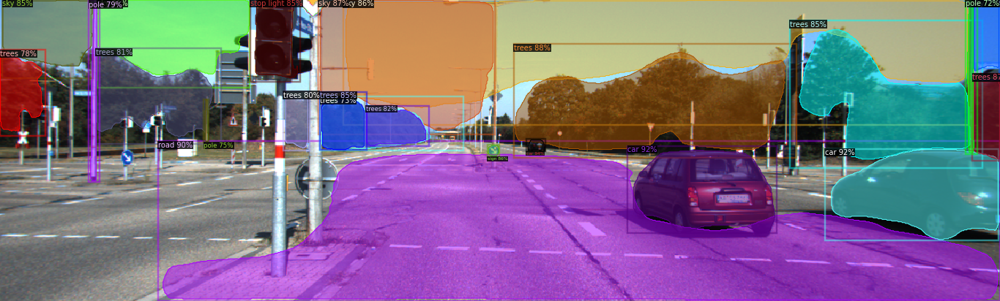

tensor([ 9,  9,  9,  4,  2,  1,  4,  1,  4,  7,  1,  4,  1, 11,  1,  1,  1,  8,
         1,  8,  1,  4,  8], device='cuda:0')
Boxes(tensor([[6.5367e+02, 1.7363e+02, 6.7725e+02, 1.8908e+02],
        [1.0244e+03, 1.8553e+02, 1.2402e+03, 2.9980e+02],
        [7.7929e+02, 1.8207e+02, 9.6465e+02, 2.9070e+02],
        [1.2091e+02, 0.0000e+00, 3.0978e+02, 1.0939e+02],
        [1.9648e+02, 1.7617e+02, 1.2420e+03, 3.7500e+02],
        [6.3834e+02, 5.5392e+01, 9.8904e+02, 1.9655e+02],
        [3.9537e+02, 0.0000e+00, 6.1418e+02, 1.6783e+02],
        [1.2076e+03, 9.2106e+01, 1.2420e+03, 2.0072e+02],
        [4.2617e+02, 3.7559e-01, 1.2028e+03, 1.5631e+02],
        [6.0544e+02, 1.8067e+02, 6.2001e+02, 1.9577e+02],
        [3.9756e+02, 1.1467e+02, 4.5513e+02, 1.8690e+02],
        [3.0550e+00, 1.1163e-01, 1.1508e+02, 9.8140e+01],
        [9.8092e+02, 2.6041e+01, 1.2201e+03, 2.0953e+02],
        [3.1077e+02, 0.0000e+00, 3.7230e+02, 1.0250e+02],
        [4.5441e+02, 1.3185e+02, 5.3258e+02, 1.8243e+02]

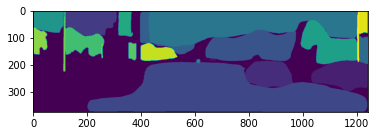

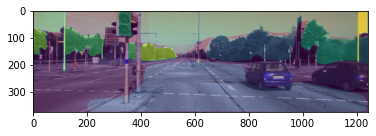

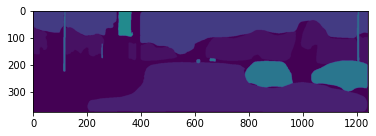

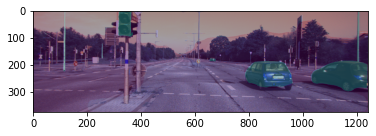

In [12]:
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/Kitti/train_images/image_2/000047_10.png")
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.1)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])



#Get bounding boxes for objects and show complete semantic segmentation image
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)
print(outputs["instances"].scores)
#print(outputs["instances"].pred_masks)



import matplotlib.pyplot as plt
import matplotlib as mpl
newimage=np.zeros((im.shape[0],im.shape[1]))
#print("shape=",im.shape)
count=outputs["instances"].to("cpu").pred_classes.numpy().shape
print("count=",outputs["instances"].to("cpu").pred_classes.numpy())

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(i+1)
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.5)
plt.show()

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(outputs["instances"].to("cpu").pred_classes.numpy()[i])
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()



norm = mpl.colors.Normalize(vmin=0,vmax=count[0])


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.5)
plt.show()

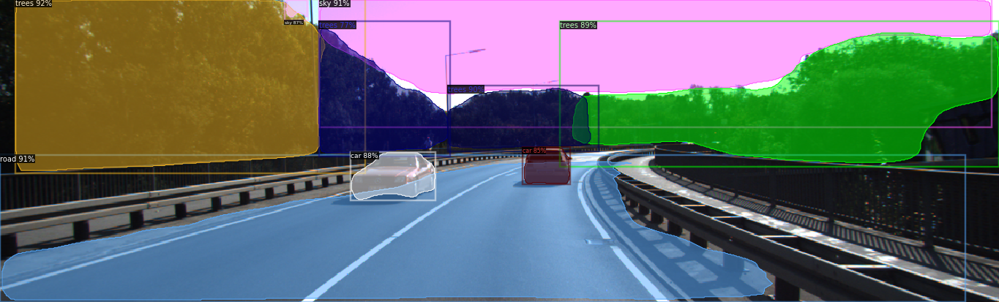

tensor([1, 2, 4, 1, 1, 9, 4, 9, 1], device='cuda:0')
Boxes(tensor([[1.8802e+01, 0.0000e+00, 4.5389e+02, 2.1636e+02],
        [0.0000e+00, 1.9330e+02, 1.1989e+03, 3.7600e+02],
        [3.9679e+02, 0.0000e+00, 1.2320e+03, 1.5885e+02],
        [5.5597e+02, 1.0684e+02, 7.4345e+02, 1.8853e+02],
        [6.9566e+02, 2.7149e+01, 1.2410e+03, 2.0758e+02],
        [4.3578e+02, 1.8968e+02, 5.4061e+02, 2.4932e+02],
        [3.5344e+02, 2.9275e-01, 3.8245e+02, 2.6014e+01],
        [6.4864e+02, 1.8348e+02, 7.0796e+02, 2.3002e+02],
        [3.9650e+02, 2.7013e+01, 5.5871e+02, 1.9550e+02]], device='cuda:0'))
tensor([0.9249, 0.9061, 0.9054, 0.8967, 0.8883, 0.8847, 0.8666, 0.8549, 0.7687],
       device='cuda:0')
count= [1 2 4 1 1 9 4 9 1]


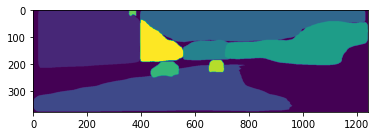

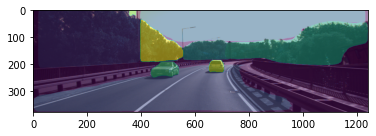

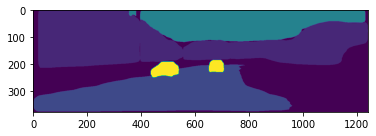

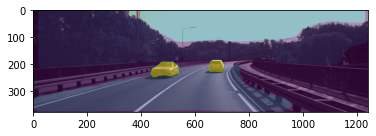

In [13]:
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/Kitti/train_images/image_2/000176_10.png")
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.1)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])




#Get bounding boxes for objects and show complete semantic segmentation image
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)
print(outputs["instances"].scores)
#print(outputs["instances"].pred_masks)



import matplotlib.pyplot as plt
import matplotlib as mpl
newimage=np.zeros((im.shape[0],im.shape[1]))
#print("shape=",im.shape)
count=outputs["instances"].to("cpu").pred_classes.numpy().shape
print("count=",outputs["instances"].to("cpu").pred_classes.numpy())

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(i+1)
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.5)
plt.show()

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(outputs["instances"].to("cpu").pred_classes.numpy()[i])
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()



norm = mpl.colors.Normalize(vmin=0,vmax=count[0])


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.5)
plt.show()

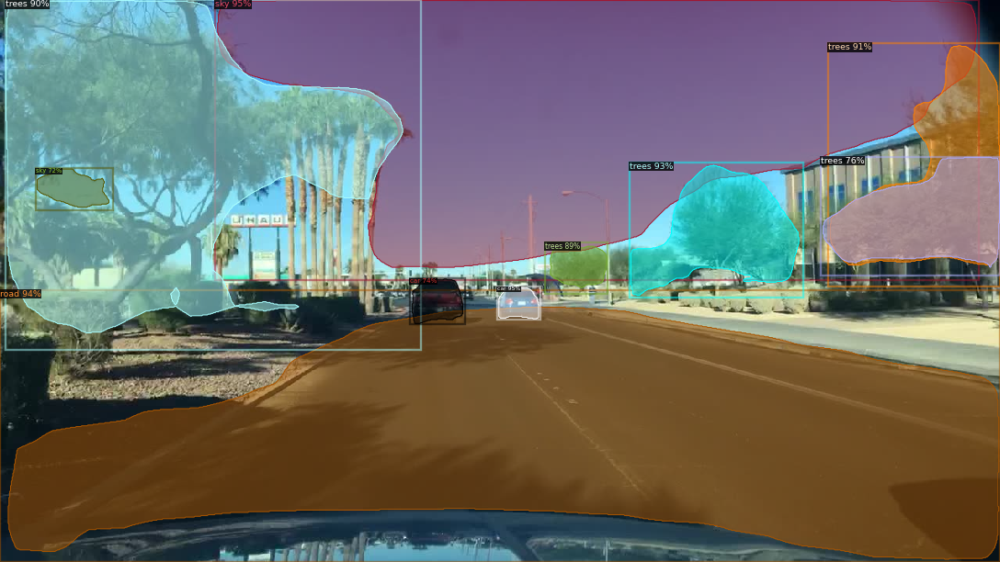

tensor([4, 9, 2, 1, 1, 1, 1, 1, 9, 4], device='cuda:0')
Boxes(tensor([[ 274.8734,    0.0000, 1252.3743,  358.6862],
        [ 636.2278,  367.4892,  692.0193,  409.5449],
        [   0.0000,  371.2508, 1280.0000,  720.0000],
        [ 805.9907,  207.9961, 1028.3986,  381.5464],
        [1059.5775,   55.3810, 1280.0000,  366.9452],
        [   6.7140,    0.0000,  538.4175,  448.7028],
        [ 697.7662,  310.3254,  777.5958,  376.5178],
        [1050.4531,  200.6937, 1280.0000,  353.1824],
        [ 524.3798,  356.9569,  595.4086,  415.8770],
        [  45.7740,  215.7321,  144.2525,  269.8783]], device='cuda:0'))
tensor([0.9540, 0.9464, 0.9359, 0.9346, 0.9102, 0.9041, 0.8893, 0.7629, 0.7355,
        0.7213], device='cuda:0')
count= [4 9 2 1 1 1 1 1 9 4]


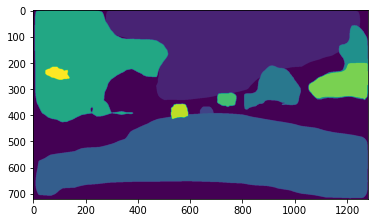

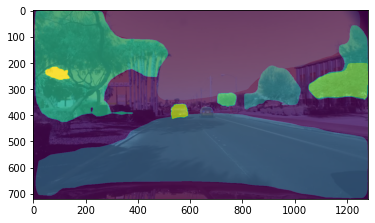

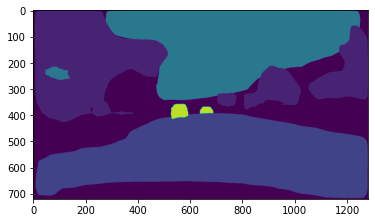

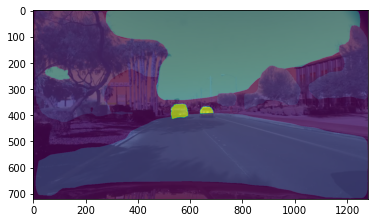

In [17]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/ccd0ec33-2be0fb05.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])




#Get bounding boxes for objects and show complete semantic segmentation image
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)
print(outputs["instances"].scores)
#print(outputs["instances"].pred_masks)



import matplotlib.pyplot as plt
import matplotlib as mpl
newimage=np.zeros((im.shape[0],im.shape[1]))
#print("shape=",im.shape)
count=outputs["instances"].to("cpu").pred_classes.numpy().shape
print("count=",outputs["instances"].to("cpu").pred_classes.numpy())

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(i+1)
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.75)
plt.show()

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(outputs["instances"].to("cpu").pred_classes.numpy()[i])
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()



norm = mpl.colors.Normalize(vmin=0,vmax=count[0])


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.75)
plt.show()

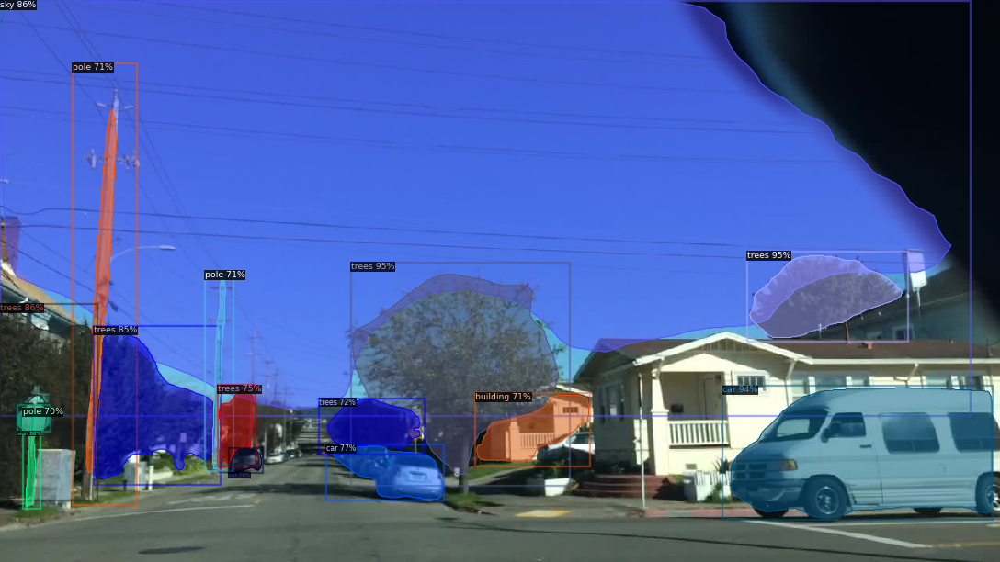

tensor([1, 1, 9, 4, 1, 1, 7, 9, 9, 1, 1, 5, 8, 8, 8], device='cuda:0')
Boxes(tensor([[9.5661e+02, 3.2248e+02, 1.1627e+03, 4.3744e+02],
        [4.4937e+02, 3.3655e+02, 7.2933e+02, 6.2275e+02],
        [9.2500e+02, 4.9440e+02, 1.2700e+03, 6.6567e+02],
        [0.0000e+00, 1.1497e+00, 1.2422e+03, 5.3311e+02],
        [0.0000e+00, 3.8939e+02, 1.2437e+02, 6.4062e+02],
        [1.2012e+02, 4.1784e+02, 2.8258e+02, 6.2153e+02],
        [2.1904e+01, 5.1842e+02, 6.4697e+01, 5.5237e+02],
        [2.9276e+02, 5.7382e+02, 3.3623e+02, 6.0587e+02],
        [4.1721e+02, 5.6951e+02, 5.6876e+02, 6.4091e+02],
        [2.7857e+02, 4.9317e+02, 3.2716e+02, 5.9750e+02],
        [4.0871e+02, 5.1025e+02, 5.4354e+02, 5.8249e+02],
        [6.0855e+02, 5.0328e+02, 7.5471e+02, 5.9723e+02],
        [9.3063e+01, 8.1061e+01, 1.7511e+02, 6.4725e+02],
        [2.6226e+02, 3.4702e+02, 2.9906e+02, 6.0381e+02],
        [2.8911e+01, 5.2279e+02, 5.1858e+01, 6.5131e+02]], device='cuda:0'))
tensor([0.9524, 0.9507, 0.9357, 0.

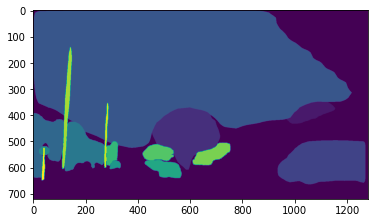

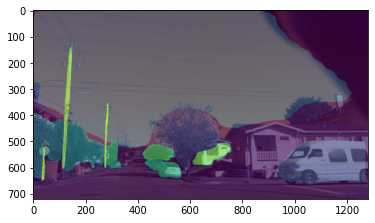

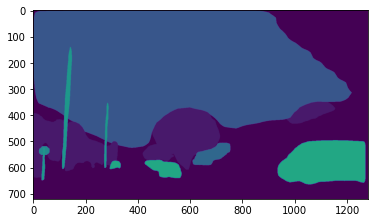

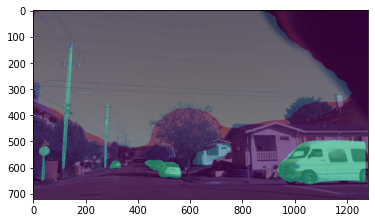

In [18]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/cdb992be-f0f1613c.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])




#Get bounding boxes for objects and show complete semantic segmentation image
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)
print(outputs["instances"].scores)
#print(outputs["instances"].pred_masks)



import matplotlib.pyplot as plt
import matplotlib as mpl
newimage=np.zeros((im.shape[0],im.shape[1]))
#print("shape=",im.shape)
count=outputs["instances"].to("cpu").pred_classes.numpy().shape
print("count=",outputs["instances"].to("cpu").pred_classes.numpy())

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(i+1)
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.65)
plt.show()

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(outputs["instances"].to("cpu").pred_classes.numpy()[i])
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()



norm = mpl.colors.Normalize(vmin=0,vmax=count[0])


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.65)
plt.show()

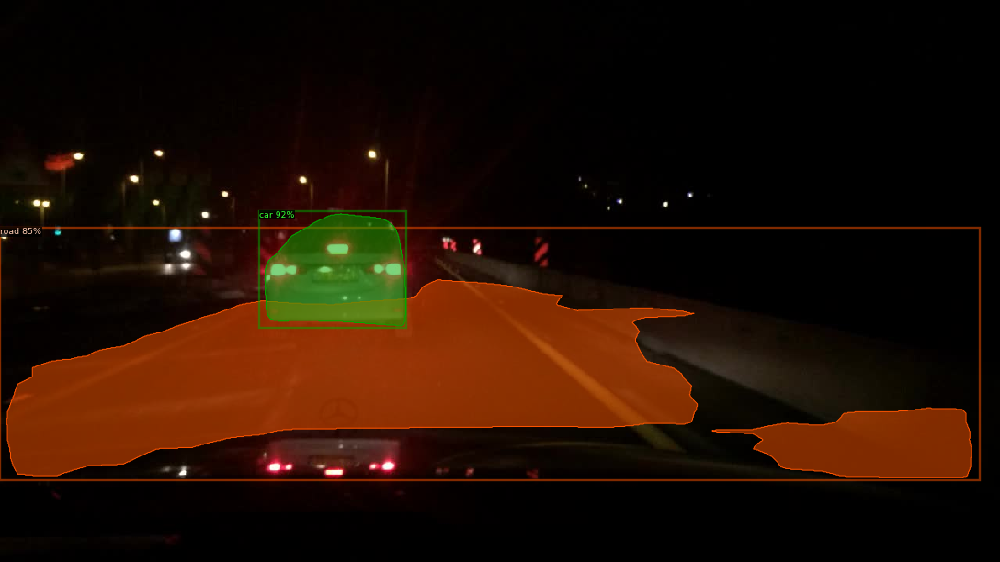

tensor([9, 2], device='cuda:0')
Boxes(tensor([[ 332.2599,  270.0816,  520.3939,  420.5844],
        [   0.0000,  291.6114, 1253.9756,  615.8436]], device='cuda:0'))
tensor([0.9225, 0.8520], device='cuda:0')
count= [9 2]


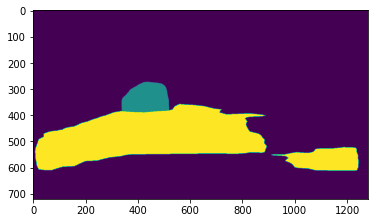

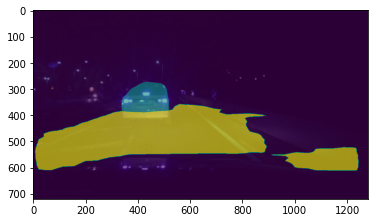

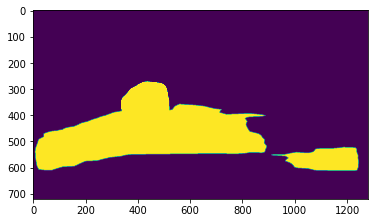

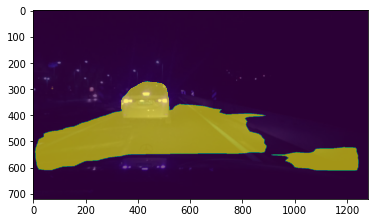

In [19]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/ce6aa1eb-90709a5b.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])




#Get bounding boxes for objects and show complete semantic segmentation image
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)
print(outputs["instances"].scores)
#print(outputs["instances"].pred_masks)



import matplotlib.pyplot as plt
import matplotlib as mpl
newimage=np.zeros((im.shape[0],im.shape[1]))
#print("shape=",im.shape)
count=outputs["instances"].to("cpu").pred_classes.numpy().shape
print("count=",outputs["instances"].to("cpu").pred_classes.numpy())

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(i+1)
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.65)
plt.show()

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(outputs["instances"].to("cpu").pred_classes.numpy()[i])
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()



norm = mpl.colors.Normalize(vmin=0,vmax=count[0])


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.65)
plt.show()

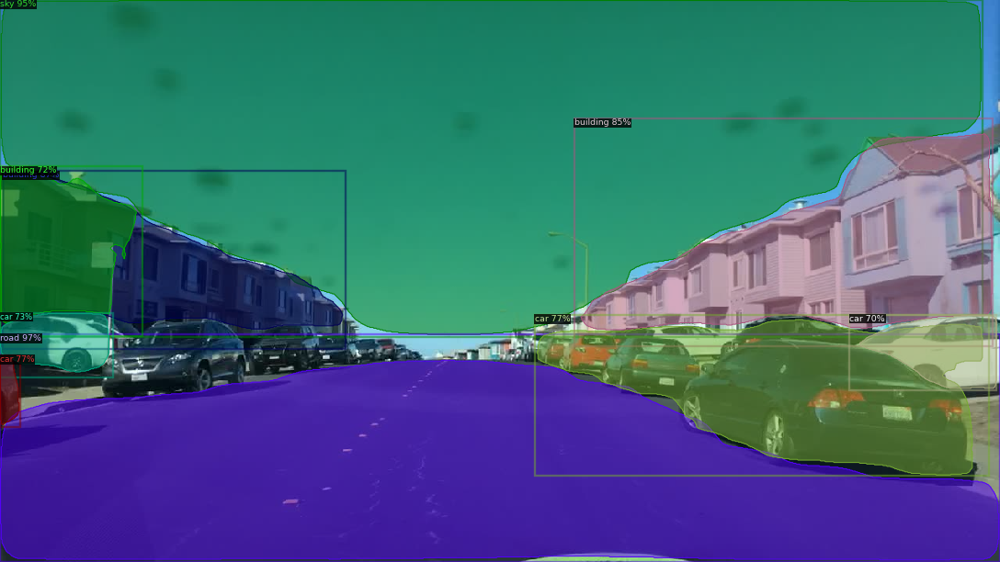

tensor([2, 4, 5, 5, 9, 9, 9, 5, 9], device='cuda:0')
Boxes(tensor([[   0.0000,  428.1667, 1280.0000,  720.0000],
        [   0.0000,    0.0000, 1257.0801,  432.0568],
        [   2.9833,  219.0491,  442.7795,  447.5361],
        [ 734.9473,  151.9604, 1270.1984,  443.0512],
        [ 684.8730,  403.6031, 1265.6843,  609.9852],
        [   0.0000,  455.0310,   26.4463,  547.4152],
        [   0.0000,  400.9222,  144.7471,  483.1812],
        [   0.0000,  213.2277,  181.9200,  430.7866],
        [1087.3846,  403.0025, 1275.7577,  499.9060]], device='cuda:0'))
tensor([0.9723, 0.9464, 0.8736, 0.8529, 0.7741, 0.7653, 0.7281, 0.7217, 0.7015],
       device='cuda:0')
count= [2 4 5 5 9 9 9 5 9]


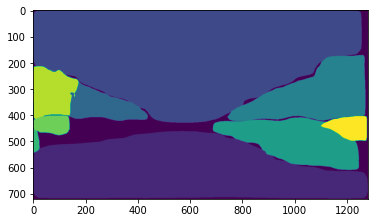

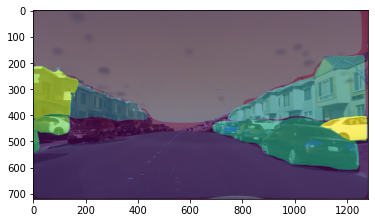

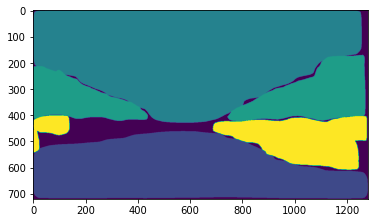

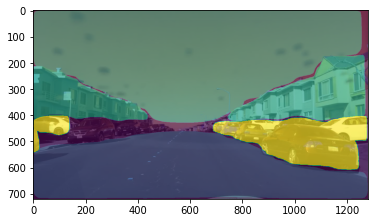

In [20]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/cf19b33b-85ffec6d.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])





#Get bounding boxes for objects and show complete semantic segmentation image
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)
print(outputs["instances"].scores)
#print(outputs["instances"].pred_masks)



import matplotlib.pyplot as plt
import matplotlib as mpl
newimage=np.zeros((im.shape[0],im.shape[1]))
#print("shape=",im.shape)
count=outputs["instances"].to("cpu").pred_classes.numpy().shape
print("count=",outputs["instances"].to("cpu").pred_classes.numpy())

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(i+1)
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.65)
plt.show()

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(outputs["instances"].to("cpu").pred_classes.numpy()[i])
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()



norm = mpl.colors.Normalize(vmin=0,vmax=count[0])


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.65)
plt.show()

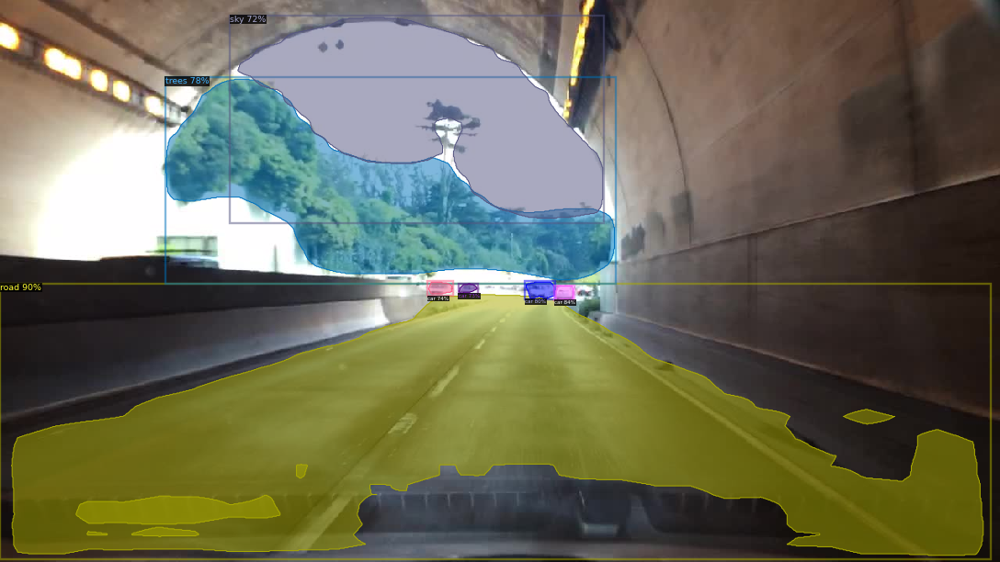

tensor([2, 9, 9, 1, 9, 9, 4], device='cuda:0')
Boxes(tensor([[   0.0000,  363.1085, 1267.9188,  716.1921],
        [ 709.8011,  365.4078,  735.2957,  384.9106],
        [ 672.2535,  360.2164,  710.7183,  383.5820],
        [ 211.6751,   98.7058,  788.7708,  363.6817],
        [ 547.5279,  360.4679,  580.1785,  379.4168],
        [ 586.9777,  363.3401,  612.2278,  376.3488],
        [ 294.7004,   19.5681,  772.4305,  286.2707]], device='cuda:0'))
tensor([0.9019, 0.8365, 0.8008, 0.7767, 0.7443, 0.7336, 0.7219],
       device='cuda:0')
count= [2 9 9 1 9 9 4]


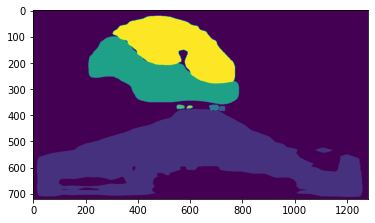

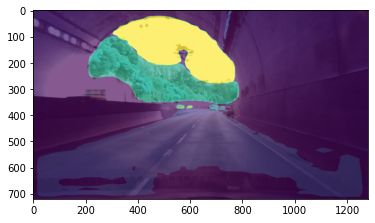

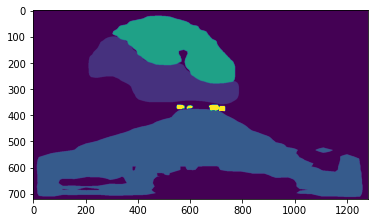

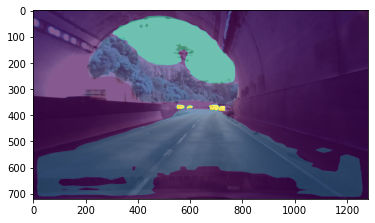

In [21]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/d6fd12ed-d08267fa.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])




#Get bounding boxes for objects and show complete semantic segmentation image
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)
print(outputs["instances"].scores)
#print(outputs["instances"].pred_masks)



import matplotlib.pyplot as plt
import matplotlib as mpl
newimage=np.zeros((im.shape[0],im.shape[1]))
#print("shape=",im.shape)
count=outputs["instances"].to("cpu").pred_classes.numpy().shape
print("count=",outputs["instances"].to("cpu").pred_classes.numpy())

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(i+1)
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.65)
plt.show()

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(outputs["instances"].to("cpu").pred_classes.numpy()[i])
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()



norm = mpl.colors.Normalize(vmin=0,vmax=count[0])


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.65)
plt.show()

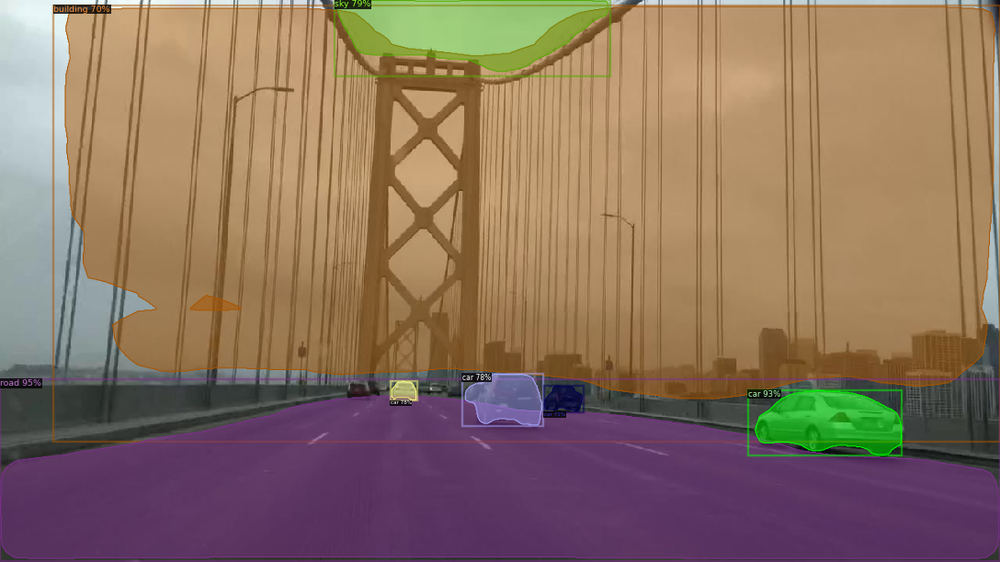

tensor([2, 9, 4, 9, 9, 9, 5], device='cuda:0')
Boxes(tensor([[   0.0000,  485.9691, 1280.0000,  718.7796],
        [ 957.1315,  499.5658, 1154.6549,  583.2421],
        [ 428.4205,    0.0000,  780.6073,   97.1670],
        [ 499.7910,  488.0359,  534.4578,  513.5123],
        [ 591.4565,  478.5064,  695.5402,  545.5232],
        [ 696.6655,  494.2773,  746.7844,  528.1806],
        [  68.7698,    6.5371, 1280.0000,  565.7493]], device='cuda:0'))
tensor([0.9519, 0.9320, 0.7938, 0.7804, 0.7766, 0.7095, 0.7048],
       device='cuda:0')
count= [2 9 4 9 9 9 5]


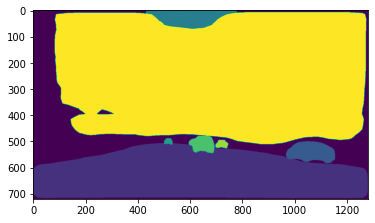

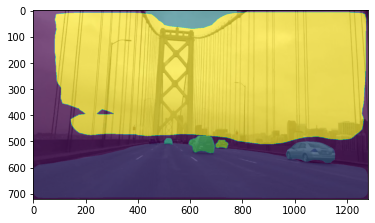

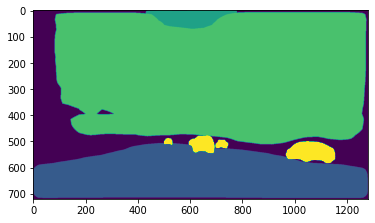

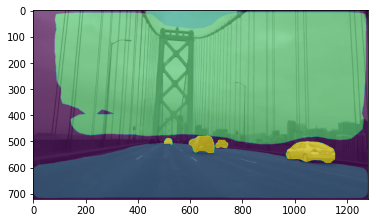

In [22]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/d07b3e01-1ff03d3b.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])




#Get bounding boxes for objects and show complete semantic segmentation image
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)
print(outputs["instances"].scores)
#print(outputs["instances"].pred_masks)



import matplotlib.pyplot as plt
import matplotlib as mpl
newimage=np.zeros((im.shape[0],im.shape[1]))
#print("shape=",im.shape)
count=outputs["instances"].to("cpu").pred_classes.numpy().shape
print("count=",outputs["instances"].to("cpu").pred_classes.numpy())

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(i+1)
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.65)
plt.show()

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(outputs["instances"].to("cpu").pred_classes.numpy()[i])
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()



norm = mpl.colors.Normalize(vmin=0,vmax=count[0])


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.65)
plt.show()

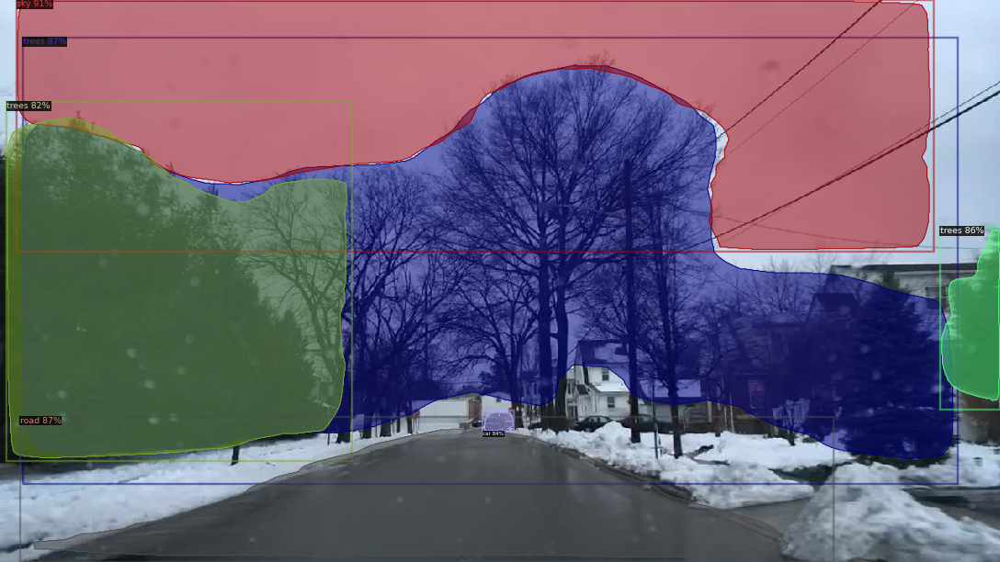

tensor([4, 1, 2, 1, 9, 1], device='cuda:0')
Boxes(tensor([[2.1582e+01, 4.0635e-01, 1.1956e+03, 3.2238e+02],
        [2.9037e+01, 4.8121e+01, 1.2253e+03, 6.2000e+02],
        [2.5824e+01, 5.3368e+02, 1.0670e+03, 7.2000e+02],
        [1.2030e+03, 2.9067e+02, 1.2800e+03, 5.2430e+02],
        [6.1819e+02, 5.2619e+02, 6.5729e+02, 5.5315e+02],
        [8.8121e+00, 1.3070e+02, 4.5022e+02, 5.9114e+02]], device='cuda:0'))
tensor([0.9061, 0.8704, 0.8655, 0.8612, 0.8380, 0.8229], device='cuda:0')
count= [4 1 2 1 9 1]


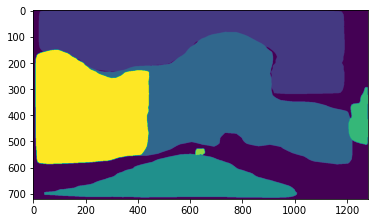

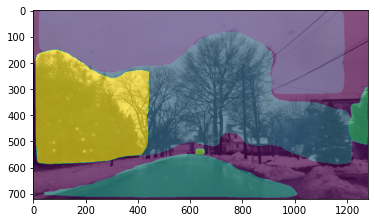

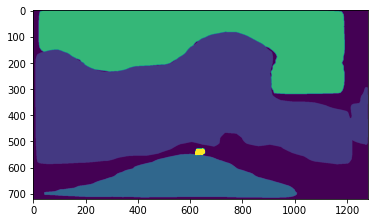

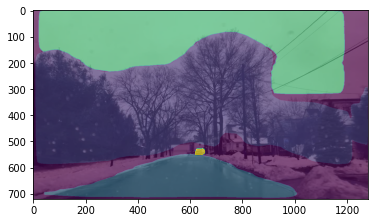

In [23]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/d7402ea7-cc563c45.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])




#Get bounding boxes for objects and show complete semantic segmentation image
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)
print(outputs["instances"].scores)
#print(outputs["instances"].pred_masks)



import matplotlib.pyplot as plt
import matplotlib as mpl
newimage=np.zeros((im.shape[0],im.shape[1]))
#print("shape=",im.shape)
count=outputs["instances"].to("cpu").pred_classes.numpy().shape
print("count=",outputs["instances"].to("cpu").pred_classes.numpy())

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(i+1)
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.65)
plt.show()

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(outputs["instances"].to("cpu").pred_classes.numpy()[i])
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()



norm = mpl.colors.Normalize(vmin=0,vmax=count[0])


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.65)
plt.show()

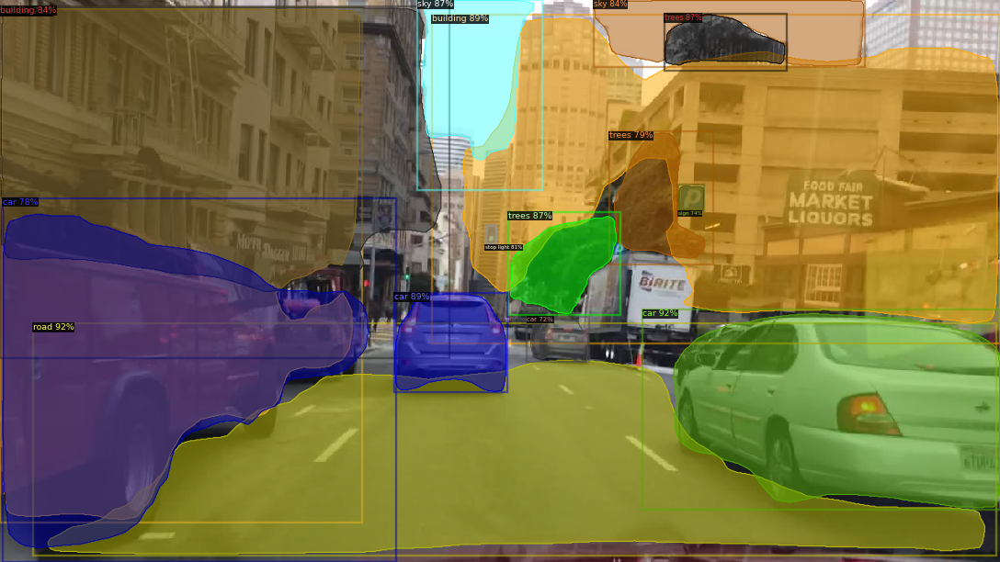

tensor([ 2,  9,  9,  5,  1,  1,  4,  5,  4, 11,  1,  9,  7,  9, 12],
       device='cuda:0')
Boxes(tensor([[  42.2520,  413.9769, 1275.5397,  711.5531],
        [ 822.8356,  396.8023, 1280.0000,  653.1400],
        [ 504.6330,  375.1590,  649.4615,  502.3117],
        [ 552.6466,   19.0245, 1280.0000,  440.0172],
        [ 650.2415,  271.2727,  793.8282,  403.7010],
        [ 850.3301,   17.4096, 1006.6768,   90.6834],
        [ 534.6110,    0.0000,  694.2943,  243.2301],
        [   0.0000,    8.3274,  574.7620,  458.6272],
        [ 759.6068,    0.0000, 1106.6029,   85.4487],
        [ 621.3173,  288.7226,  635.8334,  314.1315],
        [ 779.7473,  168.4377,  913.2346,  338.3767],
        [   3.2265,  253.8327,  506.9023,  720.0000],
        [ 868.2863,  237.0065,  901.3798,  270.6660],
        [ 674.3699,  405.9743,  753.6992,  464.0952],
        [   0.0000,    9.6077,  463.1929,  669.8041]], device='cuda:0'))
tensor([0.9189, 0.9157, 0.8923, 0.8882, 0.8692, 0.8676, 0.8664, 0.8404, 

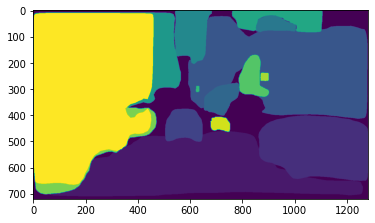

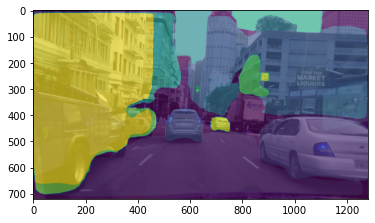

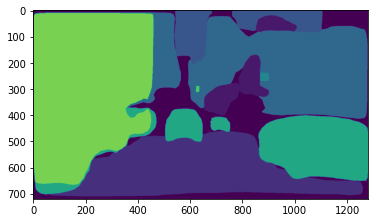

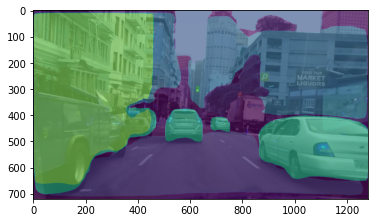

In [24]:
# We can use `Visualizer` to draw the predictions on the image.
im = cv2.imread(r"/content/drive/My Drive/CIS581/FinalProject/bdd/bdd100k/seg/images/test/bdfcba58-078407cd.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.85)

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])




#Get bounding boxes for objects and show complete semantic segmentation image
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)
print(outputs["instances"].scores)
#print(outputs["instances"].pred_masks)



import matplotlib.pyplot as plt
import matplotlib as mpl
newimage=np.zeros((im.shape[0],im.shape[1]))
#print("shape=",im.shape)
count=outputs["instances"].to("cpu").pred_classes.numpy().shape
print("count=",outputs["instances"].to("cpu").pred_classes.numpy())

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(i+1)
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.65)
plt.show()

for i in range(count[0]):
  mask=outputs["instances"].to("cpu").pred_masks.numpy()[i].astype(int)*(outputs["instances"].to("cpu").pred_classes.numpy()[i])
  newimage=np.where(mask!=0, mask, newimage)

norm = mpl.colors.Normalize(vmin=0,vmax=count[0])
plt.imshow(newimage,norm=norm)
plt.show()



norm = mpl.colors.Normalize(vmin=0,vmax=count[0])


plt.imshow(im)
plt.imshow(newimage,norm=norm, alpha=0.65)
plt.show()